#Importazione librerie e settings dell'ambiente

In [ ]:
! pip install tqdm

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

Fase 1: Data Pipeline

In [5]:
# --- 1. CONFIGURAZIONE E IPERPARAMETRI ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dimensioni dati e dataset
image_size = 64
channels_img = 3
num_classes = 10
embed_size = 100  # Dimensione per l'embedding delle etichette

# Dimensione del vettore latente (rumore z)
z_dim = 100

# Iperparametri di training
lr = 0.0001        # Passo Learning Rate 
batch_size = 64    # Dimensioni batch di immagini
n_critic = 5       # Aggiornamenti del Critico per ogni step del Generatore
lambda_gp = 10     # Peso del Gradient Penalty

In [7]:
#  --- 2. PREPARAZIONE DEI DATI ---
# Pipeline di trasformazione delle immagini:
# 1. Convertiamo l'immagine in un formato tensore che PyTorch può gestire.
# 2. Normalizziamo i valori dei pixel dall'intervallo [0, 1] all'intervallo [-1, 1].
transform = transforms.Compose([ 

    transforms.Resize(64), 

    transforms.ToTensor(), 

    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) 

]) 

# Caricamento del dataset STL10.
# Il DataLoader gestisce la creazione dei batch e il mescolamento (shuffle) dei dati.
dataloader = DataLoader(
    torchvision.datasets.STL10(
    root='./data', split='train', download=True, transform=transform ),
    batch_size=batch_size, shuffle=True
)

100.0%


Fase 2: Sviluppo del Generatore

In [8]:
# --- 3. DEFINIZIONE DELLE ARCHITETTURE - GENERATORE ---

# Classe Generatore: il suo obiettivo è prendere il rumore casuale e trasformarlo in un'immagine convincente.
class Generator(nn.Module):
    def __init__(self, z_dim, num_classes, embed_size, channels_img):
        super().__init__()
        # Embedding layer per convertire l'indice della classe (0-9) in un vettore denso
        self.label_embed = nn.Embedding(num_classes, embed_size)

        # L'input complessivo alla prima ConvTranspose2d sarà la somma di z_dim ed embed_size
        in_channels = z_dim + embed_size
        
        self.model = nn.Sequential(
            # Input: (z_dim + embed_size) x 1 x 1 -> Output: 512 x 4 x 4
            nn.ConvTranspose2d(in_channels, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            
            # Output: 256 x 8 x 8
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            
            # Output: 128 x 16 x 16
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            # Output: 64 x 32 x 32
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            # Output finale: 3 x 64 x 64 (I 3 canali RGB di STL-10)
            nn.ConvTranspose2d(64, channels_img, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh() # Normalizza gli output tra [-1, 1]
        )
    
    # Il metodo forward definisce come i dati passano attraverso la rete.
    def forward(self, z, labels):
        # 1. Otteniamo il vettore di embedding per ciascuna etichetta del batch
        # z shape: [batch_size, z_dim]
        # labels shape: [batch_size] -> embedding shape: [batch_size, embed_size]
        embedding = self.label_embed(labels)
        
        # 2. Concateniamo il rumore z e l'embedding della classe lungo la dimensione delle feature
        # x shape: [batch_size, z_dim + embed_size]
        x = torch.cat([z, embedding], dim=1)
        
        # 3. Rimodelliamo in un tensor 4D [batch_size, z_dim + embed_size, 1, 1] per la ConvTranspose2d
        x = x.unsqueeze(2).unsqueeze(3)
        
        # 4. Passiamo il tensor attraverso la rete
        return self.model(x)

Fase 3: Sviluppo del Critico

In [10]:
# --- 4. DEFINIZIONE DELLE ARCHITETTURE - CRITICO ---
class Critic(nn.Module):
    def __init__(self, num_classes, channels_img):
        super().__init__()
        
        # Embedding per trasformare la classe in una mappa spaziale 1 x 64 x 64
        self.label_embed = nn.Embedding(num_classes, 64 * 64)
        
        # 3 canali RGB + 1 canale condizionale = 4 canali in input
        in_channels = channels_img + 1
        
        self.critic = nn.Sequential(
            # Input: 4 x 64 x 64 -> Output: 64 x 32 x 32
            # Nota: Non applichiamo Normalization al primo layer
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Output: 128 x 16 x 16
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Output: 256 x 8 x 8
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Output: 512 x 4 x 4
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(512, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Output finale: 1 x 1 x 1 (score scalare non vincolato)
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0)
        )

    def forward(self, x, labels):
        # 1. Creiamo la mappa 2D dell'embedding della classe (batch_size, 1, 64, 64)
        embedding = self.label_embed(labels).view(labels.shape[0], 1, 64, 64)
        
        # 2. Concateniamo l'immagine e la mappa di embedding lungo i canali
        # x shape: [batch_size, 3, 64, 64] -> x_cond shape: [batch_size, 4, 64, 64]
        x_cond = torch.cat([x, embedding], dim=1)
        
        # 3. Calcoliamo lo score del Critico e appiattiamo a [batch_size, 1]
        return self.critic(x_cond).view(-1, 1)

Fase 4: Custom Training Loop

In [ ]:
# --- 5. FUNZIONE GRADIENT PENALTY E TRAINING LOOP ---

def compute_gradient_penalty(critic, real_samples, fake_samples, labels):
    alpha = torch.rand((real_samples.size(0), 1, 1, 1), device=device)
    interpolated = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    
    d_interpolated = critic(interpolated, labels)
    
    gradients = torch.autograd.grad(
        outputs=d_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(d_interpolated),
        create_graph=True,
        retain_graph=True
    )[0]
    
    gradients = gradients.view(gradients.size(0), -1)
    gradient_norm = gradients.norm(2, dim=1)
    penalty = torch.mean((gradient_norm - 1) ** 2)
    return penalty

# Inizializzazione modelli
gen = Generator(z_dim, num_classes, embed_size, channels_img).to(device)
critic = Critic(num_classes, channels_img).to(device)

# Ottimizzatori Adam
opt_G = optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.9))
opt_C = optim.Adam(critic.parameters(), lr=lr, betas=(0.5, 0.9))

# Training Loop senza tqdm
def train_model(num_epochs=100):
    for epoch in range(num_epochs):
        for i, (real_imgs, labels) in enumerate(dataloader):
            batch_size = real_imgs.size(0)
            real_imgs, labels = real_imgs.to(device), labels.to(device)
            
            # --- 1. Train Critico (n_critic volte) ---
            for _ in range(n_critic):
                opt_C.zero_grad()
                noise = torch.randn(batch_size, z_dim, device=device)
                fake_imgs = gen(noise, labels)
                
                critic_real = critic(real_imgs, labels)
                critic_fake = critic(fake_imgs.detach(), labels)
                
                gp = compute_gradient_penalty(critic, real_imgs, fake_imgs.detach(), labels)
                loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + lambda_gp * gp
                
                loss_critic.backward()
                opt_C.step()
            
            # --- 2. Train Generatore (1 volta) ---
            opt_G.zero_grad()
            noise = torch.randn(batch_size, z_dim, device=device)
            fake_imgs = gen(noise, labels)
            
            output_fake = critic(fake_imgs, labels)
            loss_gen = -torch.mean(output_fake)
            
            loss_gen.backward()
            opt_G.step()
            
            # Stampa periodica ogni 50 batch
            if i % 50 == 0:
                print(f"Epoca [{epoch+1}/{num_epochs}] | Batch {i}/{len(dataloader)} | "
                      f"Loss C: {loss_critic.item():.4f} | Loss G: {loss_gen.item():.4f}")

Fase 5: Validazione e Visualizzazione

In [12]:
# --- 6. CREAZIONE RUMORE FISSO PER LA GALLERIA ---

import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Creiamo 10 immagini casuali per ciascuna delle 10 classi (totale 100 immagini)
num_examples_per_class = 10
fixed_noise = torch.randn(num_classes * num_examples_per_class, z_dim, device=device)

# Generiamo le etichette ordinate: [0,0... 1,1... 2,2... fino a 9,9...]
fixed_labels = torch.tensor([[c] * num_examples_per_class for c in range(num_classes)], device=device).flatten()

In [ ]:
# --- 7. FUNZIONE PER GENERAZIONE E SALVATAGGIO NELLA GALLERIA ---

import os

# Creazione della cartella di destinazione per i file PNG
os.makedirs("output_galleries", exist_ok=True)

def generate_class_gallery(epoch, gen):
    gen.eval() # Disattiva Dropout e BatchNorm durante l'inferenza
    
    with torch.no_grad(): # Disattiva il calcolo dei gradienti
        # 1. Genera le 100 immagini condizionate
        fake_images = gen(fixed_noise, fixed_labels)
        
        # 2. Denormalizzazione dall'intervallo [-1, 1] a [0, 1]
        fake_images = (fake_images + 1) / 2.0
        
        # 3. SALVATAGGIO SU DISCO: Esporta la griglia in formato PNG
        save_path = f"output_galleries/gallery_epoch_{epoch}.png"
        vutils.save_image(
            fake_images, 
            save_path, 
            nrow=num_examples_per_class, 
            normalize=False
        )
        
        # 4. VISUALIZZAZIONE NEL NOTEBOOK: Preparazione griglia per Matplotlib
        grid = vutils.make_grid(fake_images.cpu(), nrow=num_examples_per_class, padding=2, normalize=False)
        
        plt.figure(figsize=(10, 10))
        plt.imshow(grid.permute(1, 2, 0).numpy()) # Converti da [C, H, W] a [H, W, C]
        plt.axis('off')
        plt.title(f"Galleria delle Classi - Epoca {epoch}")
        plt.show()
        
    gen.train() # Riattiva la modalità addestramento

In [ ]:
# --- 8. INTEGRAZIONE GRAFICI E LOOP COMPLETO ---

losses_c = []
losses_g = []

import time

def train_model(num_epochs=20):
    print("=== AVVIO ADDESTRAMENTO cWGAN-GP ===")
    start_time = time.time()
    
    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        running_c_loss = 0.0
        running_g_loss = 0.0
        total_batches = len(dataloader)
        
        print(f"\n--- Epoca [{epoch + 1}/{num_epochs}] ---")
        
        for i, (real_imgs, labels) in enumerate(dataloader):
            batch_size = real_imgs.size(0)
            real_imgs, labels = real_imgs.to(device), labels.to(device)
            
            # --- 1. Train Critico (n_critic volte) ---
            for _ in range(n_critic):
                opt_C.zero_grad()
                noise = torch.randn(batch_size, z_dim, device=device)
                fake_imgs = gen(noise, labels)
                
                critic_real = critic(real_imgs, labels)
                critic_fake = critic(fake_imgs.detach(), labels)
                
                gp = compute_gradient_penalty(critic, real_imgs, fake_imgs.detach(), labels)
                loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + lambda_gp * gp
                
                loss_critic.backward()
                opt_C.step()
            
            # --- 2. Train Generatore (1 volta) ---
            opt_G.zero_grad()
            noise = torch.randn(batch_size, z_dim, device=device)
            fake_imgs = gen(noise, labels)
            
            output_fake = critic(fake_imgs, labels)
            loss_gen = -torch.mean(output_fake)
            
            loss_gen.backward()
            opt_G.step()
            
            # Accumulo loss per la media dell'epoca
            running_c_loss += loss_critic.item()
            running_g_loss += loss_gen.item()
            
            # Stampa avanzamento ogni 10 batch o all'ultimo batch
            if (i + 1) % 10 == 0 or (i + 1) == total_batches:
                percent = ((i + 1) / total_batches) * 100
                print(f"Batch [{i + 1}/{total_batches}] ({percent:.0f}%) | "
                      f"Loss Critico: {loss_critic.item():.4f} | "
                      f"Loss Generatore: {loss_gen.item():.4f}")
        
        # Media loss dell'epoca
        epoch_c_loss = running_c_loss / total_batches
        epoch_g_loss = running_g_loss / total_batches
        losses_c.append(epoch_c_loss)
        losses_g.append(epoch_g_loss)
        
        epoch_duration = time.time() - epoch_start_time
        print(f"==> Fine Epoca [{epoch + 1}/{num_epochs}] (Tempo: {epoch_duration:.1f}s) | "
              f"Media Loss C: {epoch_c_loss:.4f} | Media Loss G: {epoch_g_loss:.4f}")
        
        # Generazione e salvataggio della galleria per classe ad intervalli regolari
        if (epoch + 1) % 5 == 0 or epoch == 0:
            generate_class_gallery(epoch + 1, gen)
            
    total_duration = (time.time() - start_time) / 60
    print(f"\n=== ADDESTRAMENTO COMPLETATO in {total_duration:.2f} minuti ===")

    # --- GRAFICO FINALE DELLE LOSS ---
    plt.figure(figsize=(10, 5))
    plt.plot(losses_c, label="Loss Critico")
    plt.plot(losses_g, label="Loss Generatore", alpha=0.7)
    plt.xlabel("Epoche")
    plt.ylabel("Loss")
    plt.title("Andamento della Loss durante il Training della cWGAN-GP")
    plt.legend()
    plt.grid(True)
    
    # Salvataggio del grafico su disco
    plt.savefig("loss_curve.png", bbox_inches='tight', dpi=300)
    plt.show()

=== AVVIO ADDESTRAMENTO cWGAN-GP ===

--- Epoca [1/20] ---
Batch [10/79] (13%) | Loss Critico: -62.5279 | Loss Generatore: 41.4899
Batch [20/79] (25%) | Loss Critico: -46.8095 | Loss Generatore: 42.5519
Batch [30/79] (38%) | Loss Critico: -52.0799 | Loss Generatore: 45.8649
Batch [40/79] (51%) | Loss Critico: -49.9021 | Loss Generatore: 55.2931
Batch [50/79] (63%) | Loss Critico: -43.4799 | Loss Generatore: 57.5428
Batch [60/79] (76%) | Loss Critico: -40.5465 | Loss Generatore: 55.5069
Batch [70/79] (89%) | Loss Critico: -35.6734 | Loss Generatore: 55.3008
Batch [79/79] (100%) | Loss Critico: -52.2138 | Loss Generatore: 57.1733
==> Fine Epoca [1/20] (Tempo: 221.1s) | Media Loss C: -47.2476 | Media Loss G: 49.1154


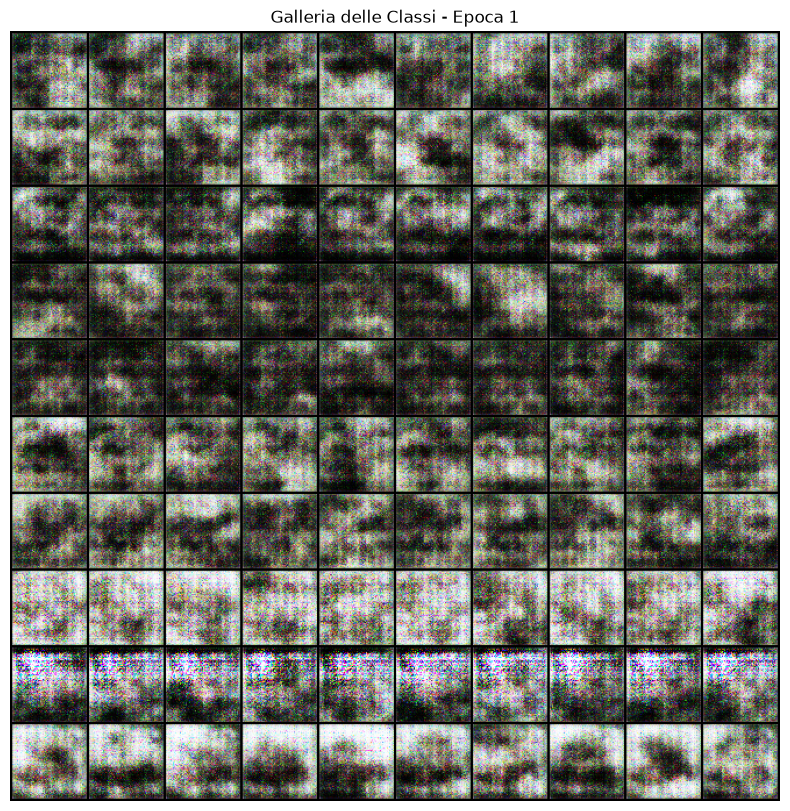


--- Epoca [2/20] ---
Batch [10/79] (13%) | Loss Critico: -33.8754 | Loss Generatore: 53.8072
Batch [20/79] (25%) | Loss Critico: -37.1362 | Loss Generatore: 62.8741
Batch [30/79] (38%) | Loss Critico: -35.3779 | Loss Generatore: 65.8876
Batch [40/79] (51%) | Loss Critico: -34.8478 | Loss Generatore: 60.3226
Batch [50/79] (63%) | Loss Critico: -33.7855 | Loss Generatore: 58.2624
Batch [60/79] (76%) | Loss Critico: -28.3564 | Loss Generatore: 63.4415
Batch [70/79] (89%) | Loss Critico: -32.1833 | Loss Generatore: 65.3430
Batch [79/79] (100%) | Loss Critico: -50.5019 | Loss Generatore: 77.8009
==> Fine Epoca [2/20] (Tempo: 217.7s) | Media Loss C: -33.3876 | Media Loss G: 61.8810

--- Epoca [3/20] ---
Batch [10/79] (13%) | Loss Critico: -38.1684 | Loss Generatore: 70.3863
Batch [20/79] (25%) | Loss Critico: -29.3377 | Loss Generatore: 64.3105
Batch [30/79] (38%) | Loss Critico: -27.2273 | Loss Generatore: 63.5892
Batch [40/79] (51%) | Loss Critico: -26.9384 | Loss Generatore: 68.7864
Batc

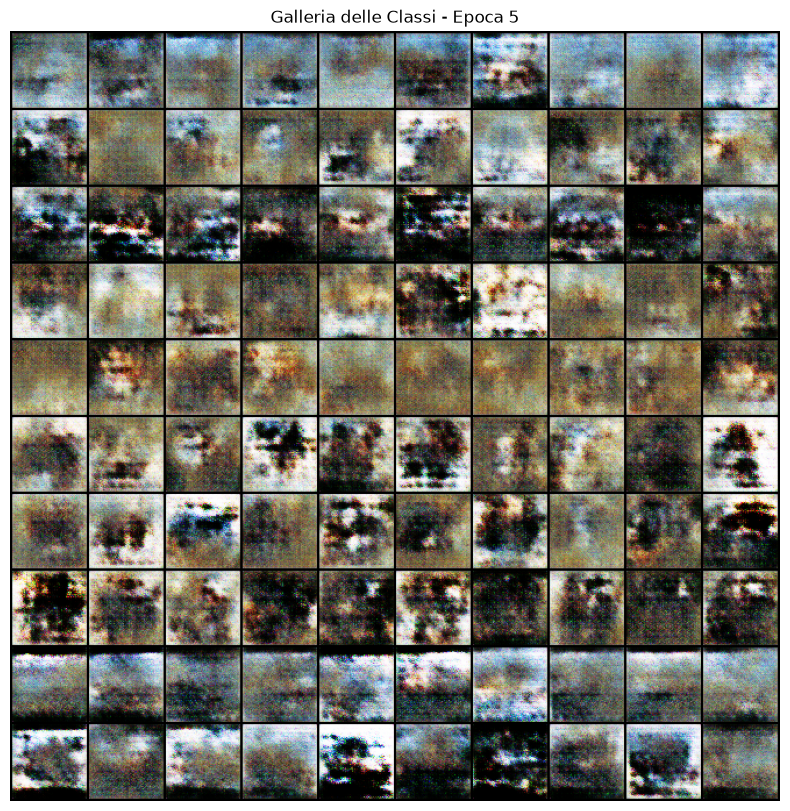


--- Epoca [6/20] ---
Batch [10/79] (13%) | Loss Critico: -22.0758 | Loss Generatore: 57.7652
Batch [20/79] (25%) | Loss Critico: -22.3594 | Loss Generatore: 59.9701
Batch [30/79] (38%) | Loss Critico: -21.2000 | Loss Generatore: 50.4421
Batch [40/79] (51%) | Loss Critico: -20.0287 | Loss Generatore: 61.3814
Batch [50/79] (63%) | Loss Critico: -20.0805 | Loss Generatore: 53.4883
Batch [60/79] (76%) | Loss Critico: -24.5025 | Loss Generatore: 62.9344
Batch [70/79] (89%) | Loss Critico: -20.2614 | Loss Generatore: 59.0082
Batch [79/79] (100%) | Loss Critico: -29.6826 | Loss Generatore: 62.9538
==> Fine Epoca [6/20] (Tempo: 195.4s) | Media Loss C: -20.9245 | Media Loss G: 57.1302

--- Epoca [7/20] ---
Batch [10/79] (13%) | Loss Critico: -21.8263 | Loss Generatore: 58.0332
Batch [20/79] (25%) | Loss Critico: -22.2596 | Loss Generatore: 52.8342
Batch [30/79] (38%) | Loss Critico: -18.8719 | Loss Generatore: 57.8833
Batch [40/79] (51%) | Loss Critico: -22.6505 | Loss Generatore: 59.1163
Batc

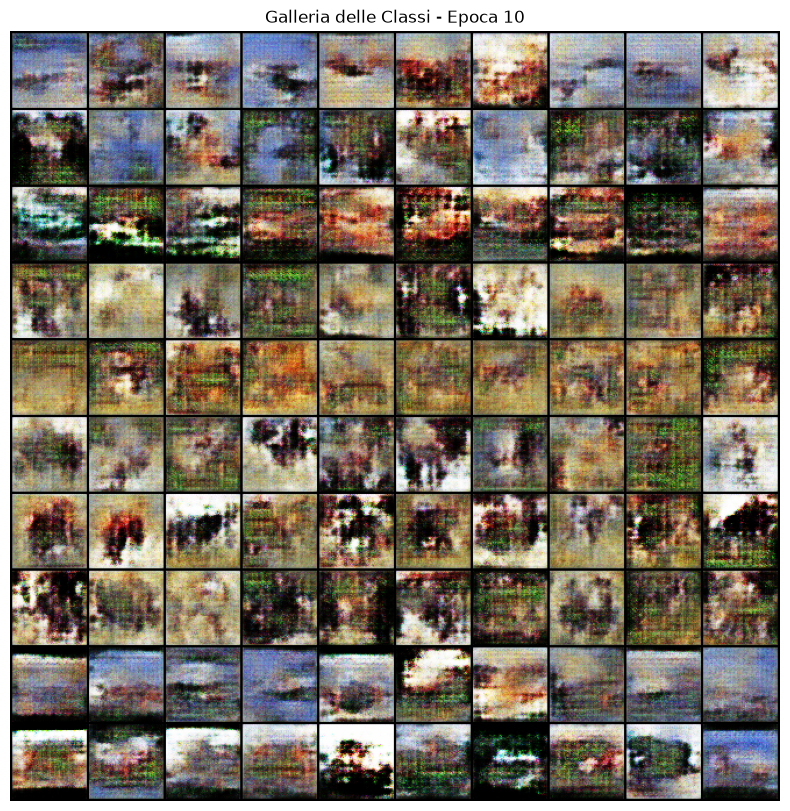


--- Epoca [11/20] ---
Batch [10/79] (13%) | Loss Critico: -23.6178 | Loss Generatore: 58.7171
Batch [20/79] (25%) | Loss Critico: -16.6934 | Loss Generatore: 65.9593
Batch [30/79] (38%) | Loss Critico: -16.6688 | Loss Generatore: 59.3750
Batch [40/79] (51%) | Loss Critico: -13.0576 | Loss Generatore: 62.5516
Batch [50/79] (63%) | Loss Critico: -14.7832 | Loss Generatore: 58.7722
Batch [60/79] (76%) | Loss Critico: -17.5318 | Loss Generatore: 68.3514
Batch [70/79] (89%) | Loss Critico: -19.0709 | Loss Generatore: 67.5667
Batch [79/79] (100%) | Loss Critico: -40.0973 | Loss Generatore: 49.1947
==> Fine Epoca [11/20] (Tempo: 190.2s) | Media Loss C: -18.0432 | Media Loss G: 60.7688

--- Epoca [12/20] ---
Batch [10/79] (13%) | Loss Critico: -24.2429 | Loss Generatore: 59.9795
Batch [20/79] (25%) | Loss Critico: -16.8233 | Loss Generatore: 55.9504
Batch [30/79] (38%) | Loss Critico: -20.8352 | Loss Generatore: 53.5509
Batch [40/79] (51%) | Loss Critico: -18.9611 | Loss Generatore: 71.1758
B

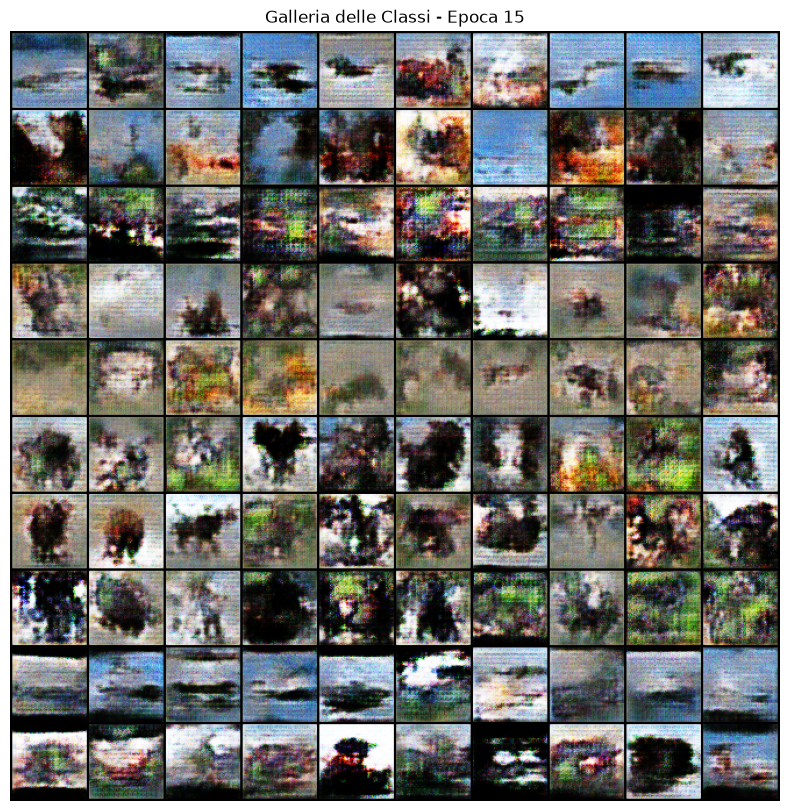


--- Epoca [16/20] ---
Batch [10/79] (13%) | Loss Critico: -18.9738 | Loss Generatore: 66.9147
Batch [20/79] (25%) | Loss Critico: -13.4779 | Loss Generatore: 68.4479
Batch [30/79] (38%) | Loss Critico: -18.5682 | Loss Generatore: 67.3157
Batch [40/79] (51%) | Loss Critico: -16.2087 | Loss Generatore: 67.1155
Batch [50/79] (63%) | Loss Critico: -16.6111 | Loss Generatore: 66.6531
Batch [60/79] (76%) | Loss Critico: -15.5970 | Loss Generatore: 63.5635
Batch [70/79] (89%) | Loss Critico: -16.9740 | Loss Generatore: 63.7907
Batch [79/79] (100%) | Loss Critico: -35.0984 | Loss Generatore: 60.6612
==> Fine Epoca [16/20] (Tempo: 224.5s) | Media Loss C: -16.5071 | Media Loss G: 64.6597

--- Epoca [17/20] ---
Batch [10/79] (13%) | Loss Critico: -12.7778 | Loss Generatore: 66.8657
Batch [20/79] (25%) | Loss Critico: -18.9159 | Loss Generatore: 76.2731
Batch [30/79] (38%) | Loss Critico: -19.7687 | Loss Generatore: 61.2043
Batch [40/79] (51%) | Loss Critico: -16.5693 | Loss Generatore: 69.9506
B

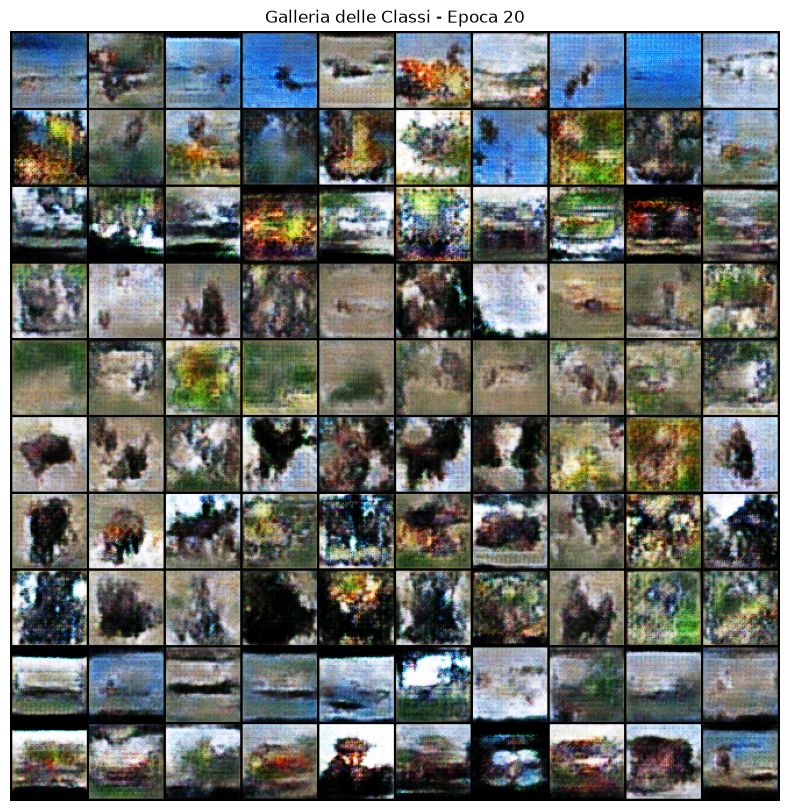


=== ADDESTRAMENTO COMPLETATO in 67.69 minuti ===


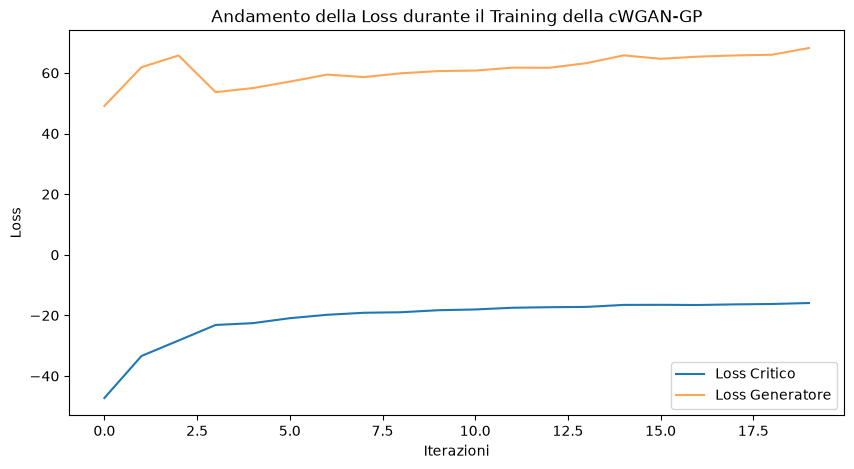

Modelli salvati con successo!


In [17]:
# --- 9. AVVIO ADDESTRAMENTO ---

# Avvio dell'addestramento per 20 epoche
train_model(num_epochs=20)

# Salvataggio dei pesi del Generatore e del Critico
torch.save(gen.state_dict(), "cWGAN_GP_Generator.pth")
torch.save(critic.state_dict(), "cWGAN_GP_Critic.pth")
print("Modelli salvati con successo!")

In [ ]:
# COMMENTO FINALE
# 
# Analisi dei Risultati e Commento FinaleStabilità dell'Addestramento e Convergenza
# L'addestramento della cWGAN-GP sul dataset STL-10 completato per 20 epoche (durata totale: ~67.7 minuti a causa dell'utilizzo della cpu) mostra un comportamento perfettamente in linea con la teoria delle Wasserstein GAN:   
# Loss del Critico (curva blu): Parte da valori negativi accentuati (~ -47) e risale gradualmente stabilizzandosi attorno a valori vicini a -15. 
# Questo andamento privo di oscillazioni brusche indica che la Gradient Penalty ($\lambda_{gp} = 10$) ha mantenuto con successo il vincolo di Lipschitzianità (1-Lipschitz), evitando il fenomeno del vanishing/exploding gradient.   
# Loss del Generatore (curva arancione): Cresce nelle prime epoche per poi assestarsi su un plateau stabile attorno a valori compresi tra 60 e 68. Il bilanciamento tra il Critico ($n_{critic} = 5$) e il Generatore ha permesso a 
# quest'ultimo di ricevere un segnale di gradiente informativo e costante durante tutto il training.   Assenza di Mode Collapse: L'andamento parallelo e regolare delle due curve conferma la stabilità della dinamica minimax ed 
# esclude problemi di collasso della modalità o divergenza del modello.   
